In [1]:
import torch
import numpy as np
import pickle
import time
import matplotlib.pyplot as plt
from PIL import Image
import os
import clip

# import sys
# sys.patorch.insert(0, '/home/sclocchi/guided')

# from guided_diffusion.clip_util import clip_embedding




def center_crop_arr(pil_image, image_size):
    # We are not on a new enough PIL to support the `reducing_gap`
    # argument, which uses BOX downsampling at powers of two first.
    # Thus, we do it by hand to improve downsample quality.
    while min(*pil_image.size) >= 2 * image_size:
        pil_image = pil_image.resize(
            tuple(x // 2 for x in pil_image.size), resample=Image.BOX
        )

    scale = image_size / min(*pil_image.size)
    pil_image = pil_image.resize(
        tuple(round(x * scale) for x in pil_image.size), resample=Image.BICUBIC
    )

    arr = np.array(pil_image)
    crop_y = (arr.shape[0] - image_size) // 2
    crop_x = (arr.shape[1] - image_size) // 2
    return arr[crop_y : crop_y + image_size, crop_x : crop_x + image_size]


def load_image(path, crop=False):
    img = Image.open(path)
    img = img.convert('RGB')
    if crop:
        # img = center_crop_arr(img, 256)
        img = center_crop_arr(img, 224)
    img = np.array(img)
    img = img.transpose(2, 0, 1)
    img = img / 255
    return img


def clip_embedding(visual, x: torch.Tensor):
    '''Compute the CLIP embedding of the input token sequence x.

    Args:
        visual (nn.Module): Visual backbone of the CLIP model.
        x (torch.Tensor): Input token sequence x of shape (B, C, 224, 224).

    Returns:
        x (torch.Tensor): Output token sequence x of shape (B, 7, 7, 768).
        class_token (torch.Tensor): Class token of shape (B, 512).
    '''

    with torch.no_grad():
        # x = x.type(torch.cuda.HalfTensor)
        x = visual.conv1(x)  # shape = [*, width, grid, grid]
        x = x.reshape(x.shape[0], x.shape[1], -1)  # shape = [*, width, grid ** 2]
        x = x.permute(0, 2, 1)  # shape = [*, grid ** 2, width]
        x = torch.cat([visual.class_embedding.to(x.dtype) + torch.zeros(x.shape[0], 1, x.shape[-1], dtype=x.dtype, device=x.device), x], dim=1)  # shape = [*, grid ** 2 + 1, width]
        x = x + visual.positional_embedding.to(x.dtype)
        x = visual.ln_pre(x)

        x = x.permute(1, 0, 2)  # NLD -> LND
        x = visual.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD

        class_token = visual.ln_post(x[:, 0, :])

        class_token = class_token @ visual.proj

        x = x[:, 1:, :]
        x = x.reshape(x.shape[0], 7, 7, x.shape[2])

        return x, class_token
    
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

def image_to_clip(path):
    proc_im = preprocess(Image.open(path)).unsqueeze(0).to(device)
    x_token, x_feat = clip_embedding(model.visual, proc_im)
    return x_token, x_feat

In [2]:
path = "/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG"



dataset_path = "/home/nlevi/Noam/SingleMaskDiffusion/guided-diffusion/datasets/tiny-imagenet-200/val/images"
# 2. Specify the image you want to analyze from that folder
#    IMPORTANT: Change "name_of_your_image.jpg" to a real image file name.
#    For example, if you have an ImageNet image: "n02123045_31.JPEG"
# image_filename = "ILSVRC2012/validation/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG" 

image_filename = "val_1485.JPEG" 




# 3. Define your text prompts
text_prompts = ["a photo of a diagram", "a photo of a dog", "a photo of a cat"]
# --- End of Configuration ---


# Construct the full path to the image
full_image_path = os.path.join(dataset_path, image_filename)

path = full_image_path

proc_im = preprocess(Image.open(path)).unsqueeze(0).to(device)

max(proc_im)

tensor([[[1.9303, 1.9303, 1.9303,  ..., 1.9303, 1.9303, 1.9303],
         [1.9303, 1.9303, 1.9303,  ..., 1.9303, 1.9303, 1.9303],
         [1.9303, 1.9303, 1.9303,  ..., 1.9303, 1.9303, 1.9303],
         ...,
         [1.9303, 1.9303, 1.9303,  ..., 1.9303, 1.9303, 1.9303],
         [1.9303, 1.9303, 1.9303,  ..., 1.9303, 1.9303, 1.9303],
         [1.9303, 1.9303, 1.9303,  ..., 1.9303, 1.9303, 1.9303]],

        [[2.0749, 2.0749, 2.0749,  ..., 2.0749, 2.0749, 2.0749],
         [2.0749, 2.0749, 2.0749,  ..., 2.0749, 2.0749, 2.0749],
         [2.0749, 2.0749, 2.0749,  ..., 2.0749, 2.0749, 2.0749],
         ...,
         [2.0749, 2.0749, 2.0749,  ..., 2.0599, 2.0599, 2.0599],
         [2.0749, 2.0749, 2.0749,  ..., 2.0599, 2.0599, 2.0599],
         [2.0749, 2.0749, 2.0749,  ..., 2.0599, 2.0599, 2.0599]],

        [[2.1459, 2.1459, 2.1459,  ..., 2.1459, 2.1459, 2.1459],
         [2.1459, 2.1459, 2.1459,  ..., 2.1459, 2.1459, 2.1459],
         [2.1459, 2.1459, 2.1459,  ..., 2.1459, 2.1459, 2.

In [102]:
# path = "/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG"

# proc_im = preprocess(Image.open(path)).unsqueeze(0).to(device)
# model.encode_image(proc_im)

# image_to_clip("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG")

224/7


32.0

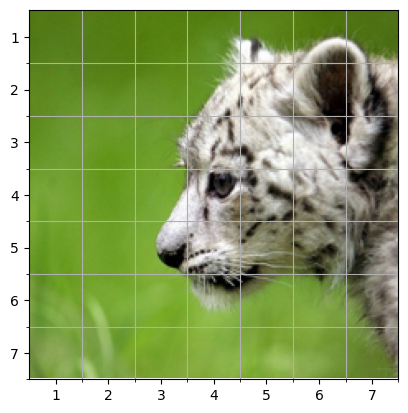

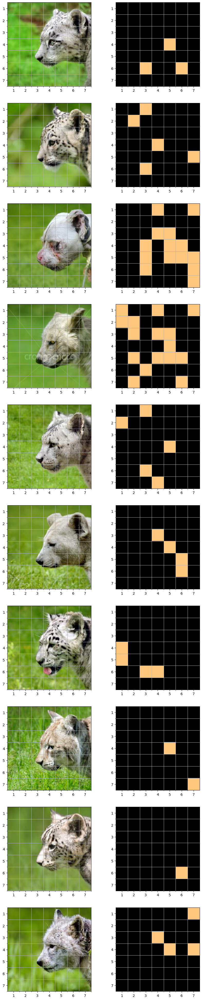

In [141]:
img_t={}
clip_t = {}
diff = {}
diff_magn = {}
spin_t = {}

seed = 110
range_seed = 10

time = 150

ticks = [32, 64, 96, 128, 160, 192, 224]

ax_ticks = [16, 48, 80, 112, 144, 176, 208]
ax_labels = [1,2,3,4,5,6,7]


img_t[0] = load_image("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG", crop=True)
# img_t[0] = preprocess(Image.open(path)).to(device)
clip_t[0], _ = image_to_clip("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG")

# spin_t[0] = (img_t[0]-0.5)*2

# for t in [25, 50, 75, 100, 125, 150, 175, 200, 225, 250]:
for t in [time]:
    img_t[t] = {}
    clip_t[t] = {}
    for se in range(seed, seed+range_seed):
        idx = se - seed
        img_t[t][idx] = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG", crop=True)
        clip_t[t][idx], _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG")
#     diff[t] = img_t[t] - img_t[0]
#     diff_magn[t] = np.linalg.norm(diff[t], axis=0)
#     spin_t[t] = (img_t[t]-0.5)*2

fig, ax = plt.subplots()
ax.imshow(img_t[0].transpose(1, 2, 0))
ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)
plt.show()

fig, axs = plt.subplots(range_seed, 2, figsize=(10, 50))
for se in range(seed, seed+range_seed):
    idx = se - seed
    diff_map = (clip_t[time][idx] - clip_t[0]).norm(dim=-1).squeeze()
    diff_map = torch.sign(diff_map-13)
    vmin = 0.0
    vmax = 1.0
    axs[idx, 0].imshow(img_t[time][idx].transpose(1, 2, 0))
    axs[idx, 1].imshow(diff_map, vmin=vmin, vmax = vmax, cmap='copper')

    axs[idx, 0].set_yticks(ticks, minor=True)
    axs[idx, 0].set_xticks(ticks, minor=True)
    axs[idx, 0].yaxis.grid(True, which='minor')
    axs[idx, 0].xaxis.grid(True, which='minor')
    axs[idx, 1].set_yticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
    axs[idx, 1].set_xticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
    axs[idx, 1].yaxis.grid(True, which='minor')
    axs[idx, 1].xaxis.grid(True, which='minor')
    axs[idx, 0].set_yticks(ax_ticks)
    axs[idx, 0].set_xticks(ax_ticks)
    axs[idx, 0].set_yticklabels(ax_labels)
    axs[idx, 0].set_xticklabels(ax_labels)
    axs[idx, 1].set_yticks([0,1,2,3,4,5,6])
    axs[idx, 1].set_xticks([0,1,2,3,4,5,6])
    axs[idx, 1].set_yticklabels(ax_labels)
    axs[idx, 1].set_xticklabels(ax_labels)


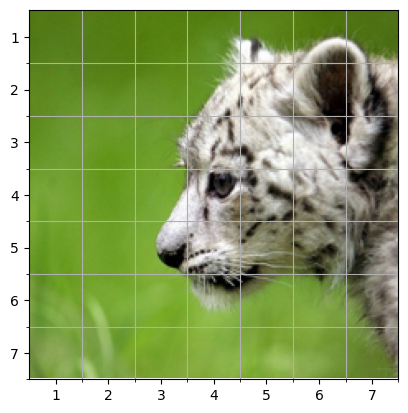

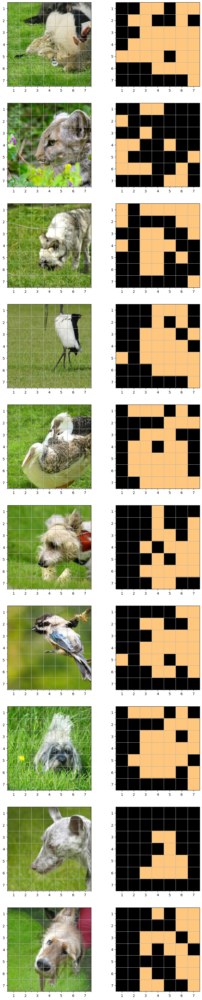

In [142]:
img_t={}
clip_t = {}
diff = {}
diff_magn = {}
spin_t = {}

seed = 110
range_seed = 10

time = 175

ticks = [32, 64, 96, 128, 160, 192, 224]

ax_ticks = [16, 48, 80, 112, 144, 176, 208]
ax_labels = [1,2,3,4,5,6,7]


img_t[0] = load_image("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG", crop=True)
# img_t[0] = preprocess(Image.open(path)).to(device)
clip_t[0], _ = image_to_clip("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG")

# spin_t[0] = (img_t[0]-0.5)*2

# for t in [25, 50, 75, 100, 125, 150, 175, 200, 225, 250]:
for t in [time]:
    img_t[t] = {}
    clip_t[t] = {}
    for se in range(seed, seed+range_seed):
        idx = se - seed
        img_t[t][idx] = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG", crop=True)
        clip_t[t][idx], _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG")
#     diff[t] = img_t[t] - img_t[0]
#     diff_magn[t] = np.linalg.norm(diff[t], axis=0)
#     spin_t[t] = (img_t[t]-0.5)*2

fig, ax = plt.subplots()
ax.imshow(img_t[0].transpose(1, 2, 0))
ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)
plt.show()

fig, axs = plt.subplots(range_seed, 2, figsize=(10, 50))
for se in range(seed, seed+range_seed):
    idx = se - seed
    diff_map = (clip_t[time][idx] - clip_t[0]).norm(dim=-1).squeeze()
    diff_map = torch.sign(diff_map-13)
    vmin = 0.0
    vmax = 1.0
    axs[idx, 0].imshow(img_t[time][idx].transpose(1, 2, 0))
    axs[idx, 1].imshow(diff_map, vmin=vmin, vmax = vmax, cmap='copper')

    axs[idx, 0].set_yticks(ticks, minor=True)
    axs[idx, 0].set_xticks(ticks, minor=True)
    axs[idx, 0].yaxis.grid(True, which='minor')
    axs[idx, 0].xaxis.grid(True, which='minor')
    axs[idx, 1].set_yticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
    axs[idx, 1].set_xticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
    axs[idx, 1].yaxis.grid(True, which='minor')
    axs[idx, 1].xaxis.grid(True, which='minor')
    axs[idx, 0].set_yticks(ax_ticks)
    axs[idx, 0].set_xticks(ax_ticks)
    axs[idx, 0].set_yticklabels(ax_labels)
    axs[idx, 0].set_xticklabels(ax_labels)
    axs[idx, 1].set_yticks([0,1,2,3,4,5,6])
    axs[idx, 1].set_xticks([0,1,2,3,4,5,6])
    axs[idx, 1].set_yticklabels(ax_labels)
    axs[idx, 1].set_xticklabels(ax_labels)


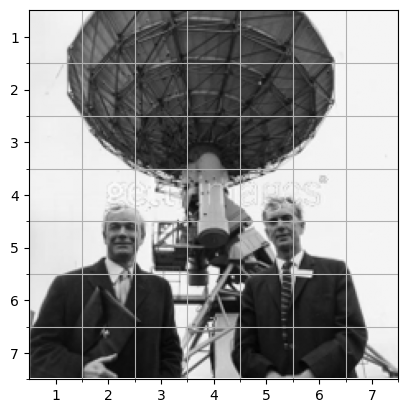

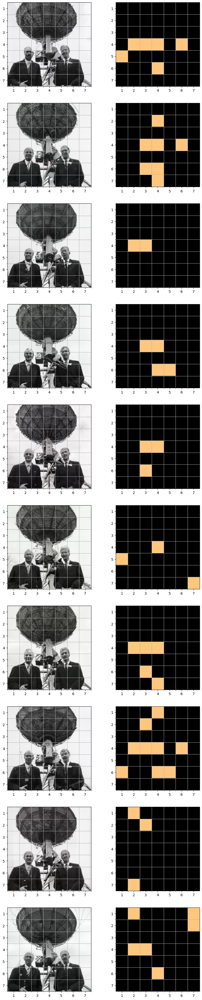

In [150]:
img_t={}
clip_t = {}
diff = {}
diff_magn = {}
spin_t = {}

seed = 110
range_seed = 10

time = 75

ticks = [32, 64, 96, 128, 160, 192, 224]

ax_ticks = [16, 48, 80, 112, 144, 176, 208]
ax_labels = [1,2,3,4,5,6,7]

# n04044716_ILSVRC2012_val_00002494
img_t[0] = load_image("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n04044716/n04044716_ILSVRC2012_val_00002494.JPEG", crop=True)
# img_t[0] = preprocess(Image.open(path)).to(device)
clip_t[0], _ = image_to_clip("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n04044716/n04044716_ILSVRC2012_val_00002494.JPEG")

# spin_t[0] = (img_t[0]-0.5)*2

# for t in [25, 50, 75, 100, 125, 150, 175, 200, 225, 250]:
for t in [time]:
    img_t[t] = {}
    clip_t[t] = {}
    for se in range(seed, seed+range_seed):
        idx = se - seed
        img_t[t][idx] = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n04044716_ILSVRC2012_val_00002494_t{t*4:04d}.JPEG", crop=True)
        clip_t[t][idx], _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n04044716_ILSVRC2012_val_00002494_t{t*4:04d}.JPEG")
#     diff[t] = img_t[t] - img_t[0]
#     diff_magn[t] = np.linalg.norm(diff[t], axis=0)
#     spin_t[t] = (img_t[t]-0.5)*2

fig, ax = plt.subplots()
ax.imshow(img_t[0].transpose(1, 2, 0))
ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)
plt.show()

fig, axs = plt.subplots(range_seed, 2, figsize=(10, 50))
for se in range(seed, seed+range_seed):
    idx = se - seed
    diff_map = (clip_t[time][idx] - clip_t[0]).norm(dim=-1).squeeze()
    diff_map = torch.sign(diff_map-13)
    vmin = 0.0
    vmax = 1.0
    axs[idx, 0].imshow(img_t[time][idx].transpose(1, 2, 0))
    axs[idx, 1].imshow(diff_map, vmin=vmin, vmax = vmax, cmap='copper')

    axs[idx, 0].set_yticks(ticks, minor=True)
    axs[idx, 0].set_xticks(ticks, minor=True)
    axs[idx, 0].yaxis.grid(True, which='minor')
    axs[idx, 0].xaxis.grid(True, which='minor')
    axs[idx, 1].set_yticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
    axs[idx, 1].set_xticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
    axs[idx, 1].yaxis.grid(True, which='minor')
    axs[idx, 1].xaxis.grid(True, which='minor')
    axs[idx, 0].set_yticks(ax_ticks)
    axs[idx, 0].set_xticks(ax_ticks)
    axs[idx, 0].set_yticklabels(ax_labels)
    axs[idx, 0].set_xticklabels(ax_labels)
    axs[idx, 1].set_yticks([0,1,2,3,4,5,6])
    axs[idx, 1].set_xticks([0,1,2,3,4,5,6])
    axs[idx, 1].set_yticklabels(ax_labels)
    axs[idx, 1].set_xticklabels(ax_labels)


In [111]:
torch.sign(diff_map-13)

tensor([[-1., -1., -1., -1., -1., -1., -1.],
        [-1., -1., -1., -1., -1., -1., -1.],
        [-1., -1., -1., -1., -1., -1., -1.],
        [-1., -1., -1., -1., -1., -1., -1.],
        [-1., -1., -1., -1., -1., -1., -1.],
        [-1., -1., -1., -1., -1., -1., -1.],
        [-1., -1., -1., -1., -1., -1., -1.]])

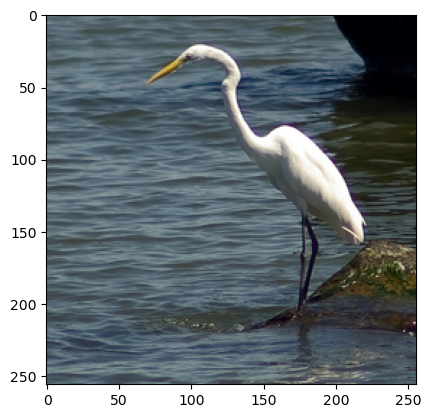

In [9]:
plt.imshow(img_t[0].transpose(1, 2, 0))

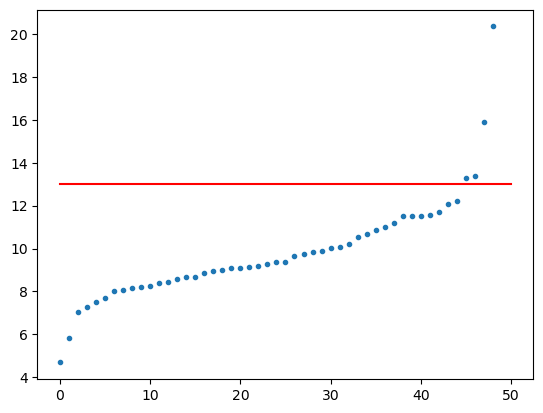

In [135]:
plt.plot(torch.sort((clip_t[150][6] - clip_t[0]).norm(dim=-1).flatten()).values, '.')
plt.plot([0,50], [13,13], 'r')

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 10.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([19.22842216, 19.24842262, 19.26842308, 19.28842163, 19.30842209,
        19.32842255, 19.348423  , 19.36842155, 19.38842201, 19.40842247,
        19.42842293, 19.44842148, 19.46842194, 19.48842239, 19.50842285,
        19.5284214 , 19.54842186, 19.56842232, 19.58842278, 19.60842133,
        19.62842178, 19.64842224, 19.6684227 , 19.68842125, 19.70842171,
        19.72842216, 19.74842262, 19.76842308, 19.78842163, 19.80842209,
        19.82842255, 19.848423  , 19.86842155, 19.88842201, 19.90842247,
        19.92842293, 19.94842148, 19.96842194, 19.98842239, 20.00842285,
        20.0284214 , 20.04842186, 20.06842232, 20.08842278, 20.10842133,
        20.12842178, 20.14842224, 20.1684227 , 20.18842125,

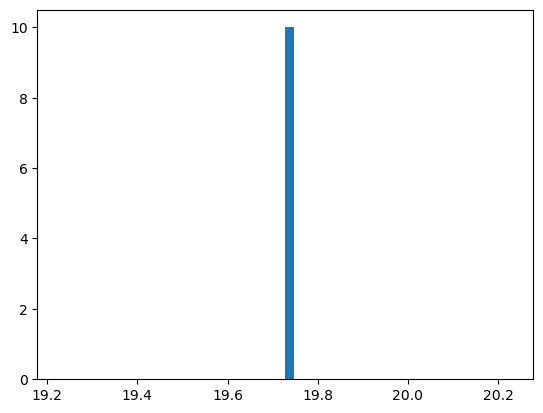

In [70]:
list_max = []
for i in clip_t[250].keys():
    list_max.append(max((clip_t[250][1] - clip_t[0]).norm(dim=-1).flatten()))

plt.hist(list_max, 50)

In [71]:
max(list_max)

tensor(19.7284)

## Paper plots

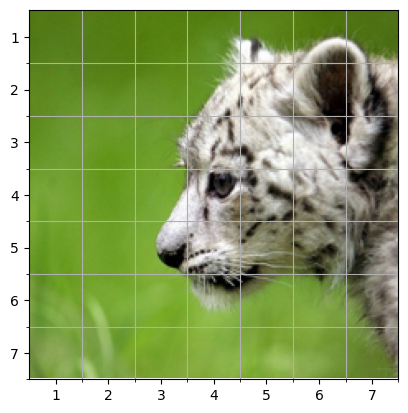

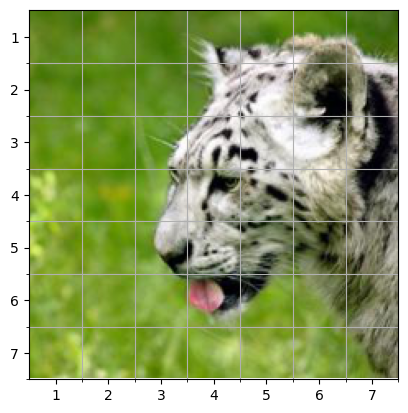

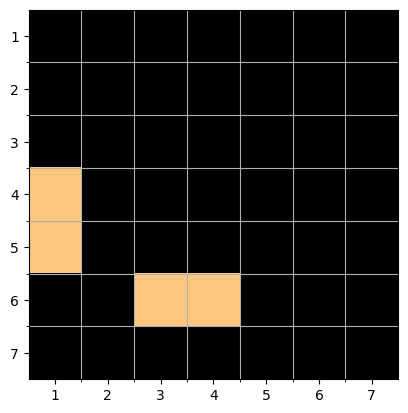

In [154]:
time = 150
se = 116

ticks = [32, 64, 96, 128, 160, 192, 224]

ax_ticks = [16, 48, 80, 112, 144, 176, 208]
ax_labels = [1,2,3,4,5,6,7]


img_t0 = load_image("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG", crop=True)
clip_t0, _ = image_to_clip("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/n02128757/n02128757_ILSVRC2012_val_00005277.JPEG")

fig, ax = plt.subplots()
ax.imshow(img_t0.transpose(1, 2, 0))
ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)

fig.savefig("../../plots/clip_diffusion/leo_t0.png", dpi=600, bbox_inches='tight')

plt.show()


t = 150
img_t150 = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG", crop=True)
clip_t150, _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG")

fig, ax = plt.subplots()
ax.imshow(img_t150.transpose(1, 2, 0))

ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)

fig.savefig("../../plots/clip_diffusion/leo_t150.png", dpi=600, bbox_inches='tight')

plt.show()



fig, ax = plt.subplots()

diff_map = (clip_t150 - clip_t0).norm(dim=-1).squeeze()
diff_map = torch.sign(diff_map-13)
vmin = 0.0
vmax = 1.0

ax.imshow(diff_map, vmin=vmin, vmax = vmax, cmap='copper')

ax.set_yticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
ax.set_xticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')

ax.set_yticks([0,1,2,3,4,5,6])
ax.set_xticks([0,1,2,3,4,5,6])
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)

# fig.savefig("../../plots/clip_diffusion/leo-clip_diff_map-t150.png", dpi=300, bbox_inches='tight')

plt.show()

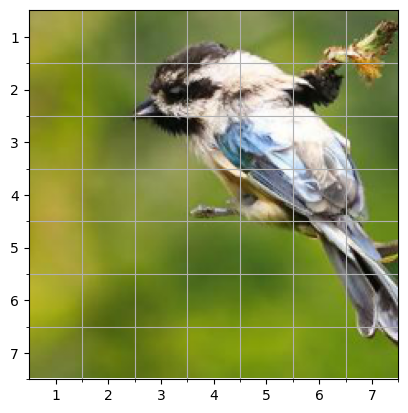

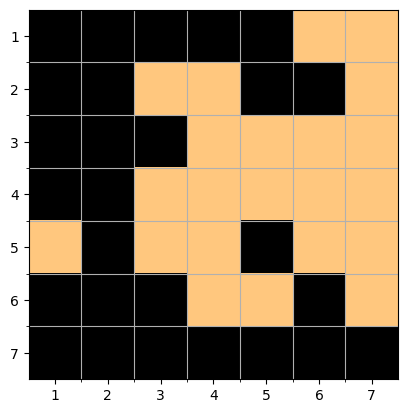

In [156]:
t = 175
se = 116

img_t175 = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG", crop=True)
clip_t175, _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG")

fig, ax = plt.subplots()
ax.imshow(img_t175.transpose(1, 2, 0))

ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)

# fig.savefig(f"../../plots/clip_diffusion/leo_t{t}.png", dpi=600, bbox_inches='tight')

plt.show()



fig, ax = plt.subplots()

diff_map = (clip_t175 - clip_t0).norm(dim=-1).squeeze()
diff_map = torch.sign(diff_map-13)
vmin = 0.0
vmax = 1.0

ax.imshow(diff_map, vmin=vmin, vmax = vmax, cmap='copper')

ax.set_yticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
ax.set_xticks([0.5, 1.5,2.5,3.5,4.5,5.5], minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')

ax.set_yticks([0,1,2,3,4,5,6])
ax.set_xticks([0,1,2,3,4,5,6])
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)

# fig.savefig(f"../../plots/clip_diffusion/leo-clip_diff_map-t{t}.png", dpi=300, bbox_inches='tight')

plt.show()

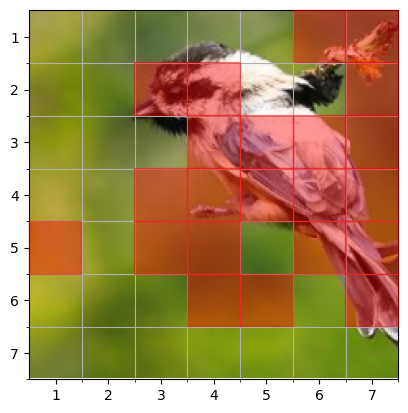

In [180]:
t = 175
se = 116

img_t175 = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG", crop=True)
clip_t175, _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG")

fig, ax = plt.subplots()
ax.imshow(img_t175.transpose(1, 2, 0))

ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)


# fig.patches.extend([plt.Rectangle((1/7,1/7),2/7,2/7,
#                                   fill=True, color='r', alpha=0.5, zorder=1000,
#                                   transform=ax.transAxes, figure=fig)])

diff_map = (clip_t175 - clip_t0).norm(dim=-1).squeeze()
diff_map = torch.sign(diff_map-13)

row_range, col_range = np.meshgrid(range(7), range(7))

for row, col in zip(row_range.flatten(), col_range.flatten()):
    if diff_map[6-row, col] > 0.5:
        rect = plt.Rectangle((col/7,row/7),1/7,1/7,
                              fill=True, color='r', alpha=0.4, zorder=1000,
                              transform=ax.transAxes, figure=fig)
        fig.patches.extend([rect])


# fig.savefig(f"../../plots/clip_diffusion/leo_t{t}-highlight_clip_patch.png", dpi=600, bbox_inches='tight')

plt.show()


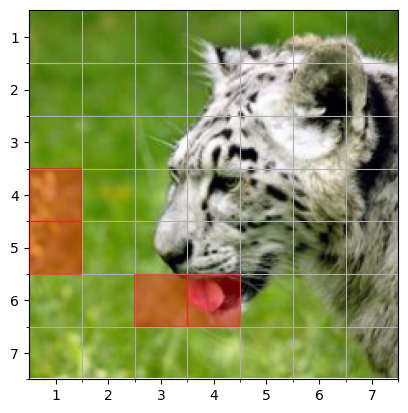

In [182]:
t = 150
se = 116

img_t150 = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG", crop=True)
clip_t150, _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/n02128757_ILSVRC2012_val_00005277_t{t*4:04d}.JPEG")

fig, ax = plt.subplots()
ax.imshow(img_t150.transpose(1, 2, 0))

ax.set_yticks(ticks, minor=True)
ax.set_xticks(ticks, minor=True)
ax.yaxis.grid(True, which='minor')
ax.xaxis.grid(True, which='minor')
ax.set_yticks(ax_ticks)
ax.set_xticks(ax_ticks)
ax.set_yticklabels(ax_labels)
ax.set_xticklabels(ax_labels)


# fig.patches.extend([plt.Rectangle((1/7,1/7),2/7,2/7,
#                                   fill=True, color='r', alpha=0.5, zorder=1000,
#                                   transform=ax.transAxes, figure=fig)])

diff_map = (clip_t150 - clip_t0).norm(dim=-1).squeeze()
diff_map = torch.sign(diff_map-13)

row_range, col_range = np.meshgrid(range(7), range(7))

for row, col in zip(row_range.flatten(), col_range.flatten()):
    if diff_map[6-row, col] > 0.5:
        rect = plt.Rectangle((col/7,row/7),1/7,1/7,
                              fill=True, color='r', alpha=0.4, zorder=1000,
                              transform=ax.transAxes, figure=fig)
        fig.patches.extend([rect])


fig.savefig(f"../../plots/clip_diffusion/leo_t{t}-highlight_clip_patch.png", dpi=600, bbox_inches='tight')

plt.show()


# Image visualizations

In [1]:
import torch
import numpy as np
import pickle
import time
import matplotlib.pyplot as plt
from PIL import Image

import clip

# import sys
# sys.patorch.insert(0, '/home/sclocchi/guided')

# from guided_diffusion.clip_util import clip_embedding


def center_crop_arr(pil_image, image_size):
    # We are not on a new enough PIL to support the `reducing_gap`
    # argument, which uses BOX downsampling at powers of two first.
    # Thus, we do it by hand to improve downsample quality.
    while min(*pil_image.size) >= 2 * image_size:
        pil_image = pil_image.resize(
            tuple(x // 2 for x in pil_image.size), resample=Image.BOX
        )

    scale = image_size / min(*pil_image.size)
    pil_image = pil_image.resize(
        tuple(round(x * scale) for x in pil_image.size), resample=Image.BICUBIC
    )

    arr = np.array(pil_image)
    crop_y = (arr.shape[0] - image_size) // 2
    crop_x = (arr.shape[1] - image_size) // 2
    return arr[crop_y : crop_y + image_size, crop_x : crop_x + image_size]


def load_image(path, crop=False):
    img = Image.open(path)
    img = img.convert('RGB')
    if crop:
        # img = center_crop_arr(img, 256)
        img = center_crop_arr(img, 224)
    img = np.array(img)
    img = img.transpose(2, 0, 1)
    img = img / 255
    return img


def clip_embedding(visual, x: torch.Tensor):
    '''Compute the CLIP embedding of the input token sequence x.

    Args:
        visual (nn.Module): Visual backbone of the CLIP model.
        x (torch.Tensor): Input token sequence x of shape (B, C, 224, 224).

    Returns:
        x (torch.Tensor): Output token sequence x of shape (B, 7, 7, 768).
        class_token (torch.Tensor): Class token of shape (B, 512).
    '''

    with torch.no_grad():
        # x = x.type(torch.cuda.HalfTensor)
        x = visual.conv1(x)  # shape = [*, width, grid, grid]
        x = x.reshape(x.shape[0], x.shape[1], -1)  # shape = [*, width, grid ** 2]
        x = x.permute(0, 2, 1)  # shape = [*, grid ** 2, width]
        x = torch.cat([visual.class_embedding.to(x.dtype) + torch.zeros(x.shape[0], 1, x.shape[-1], dtype=x.dtype, device=x.device), x], dim=1)  # shape = [*, grid ** 2 + 1, width]
        x = x + visual.positional_embedding.to(x.dtype)
        x = visual.ln_pre(x)

        x = x.permute(1, 0, 2)  # NLD -> LND
        x = visual.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD

        class_token = visual.ln_post(x[:, 0, :])

        class_token = class_token @ visual.proj

        x = x[:, 1:, :]
        x = x.reshape(x.shape[0], 7, 7, x.shape[2])

        return x, class_token
    
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

def image_to_clip(path):
    proc_im = preprocess(Image.open(path)).unsqueeze(0).to(device)
    x_token, x_feat = clip_embedding(model.visual, proc_im)
    return x_token, x_feat

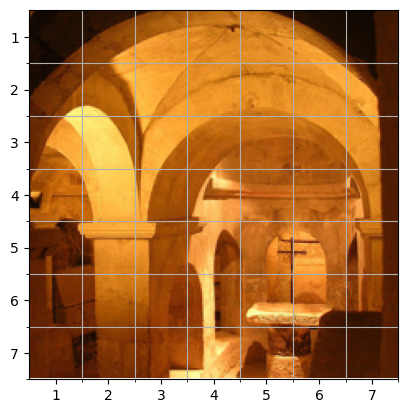

In [36]:
# img = 'n02128757_ILSVRC2012_val_00005277'
# img = 'n02009912_ILSVRC2012_val_00005314'
# img ='n02051845_ILSVRC2012_val_00003147'
# img = 'n03642806_ILSVRC2012_val_00001713'
# img = 'n04044716_ILSVRC2012_val_00002494'
img = 'n04523525_ILSVRC2012_val_00004513'
class_fold = img.split('_')[0]

img_t0 = load_image("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/"+class_fold+"/"+img+".JPEG", crop=True)
clip_t0, _ = image_to_clip("/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/starting/"+class_fold+"/"+img+".JPEG")

def represent_img_patches(img_t150, clip_t150, ax, fig):
    ticks = [32, 64, 96, 128, 160, 192, 224]

    ax_ticks = [16, 48, 80, 112, 144, 176, 208]
    ax_labels = [1,2,3,4,5,6,7]
    
    ax.imshow(img_t150.transpose(1, 2, 0))

    ax.set_yticks(ticks, minor=True)
    ax.set_xticks(ticks, minor=True)
    ax.yaxis.grid(True, which='minor')
    ax.xaxis.grid(True, which='minor')
    ax.set_yticks(ax_ticks)
    ax.set_xticks(ax_ticks)
    ax.set_yticklabels(ax_labels)
    ax.set_xticklabels(ax_labels)


    diff_map = (clip_t150 - clip_t0).norm(dim=-1).squeeze()
    diff_map = torch.sign(diff_map-13)

    row_range, col_range = np.meshgrid(range(7), range(7))

    for row, col in zip(row_range.flatten(), col_range.flatten()):
        if diff_map[6-row, col] > 0.5:
            rect = plt.Rectangle((col/7,row/7),1/7,1/7,
                                fill=True, color='r', alpha=0.4, zorder=1000,
                                transform=ax.transAxes, figure=fig)
            ax.add_patch(rect)

    return ax

fig, ax = plt.subplots()
represent_img_patches(img_t0, clip_t0, ax, fig)

# fig.savefig(f"../../plots/clip_diffusion/{img}_t0.png", dpi=600, bbox_inches='tight')

plt.show()

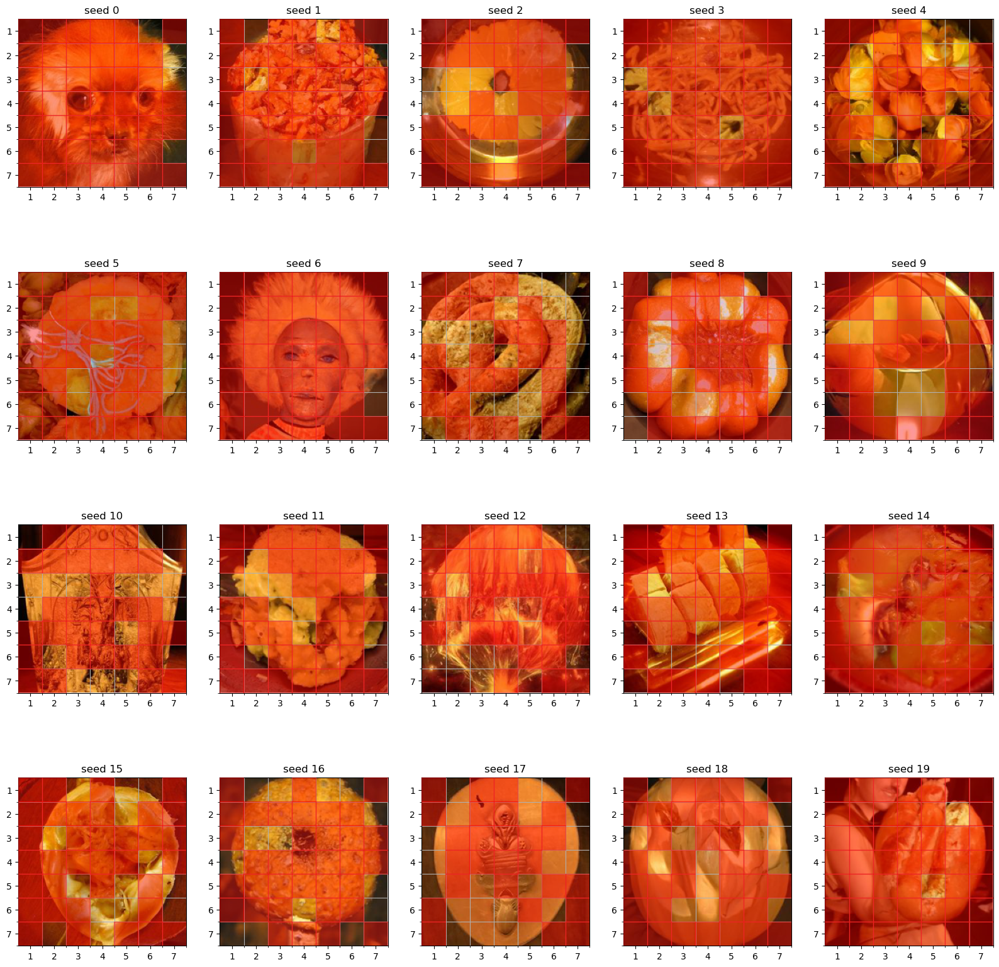

In [43]:
t = 175



# se = 116

seed_range = range(0, 20)

num_seed = len(seed_range)
num_rows = num_seed//5
num_cols = 5

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20))

for iss,se in enumerate(seed_range):
    ir = iss//num_cols
    ic = iss%num_cols
    ax = axs[ir, ic]
    ax.set_title(f"seed {se}")

    img_t = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/"+img+f"_t{t*4:04d}.JPEG", crop=True)
    clip_t, _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/"+img+f"_t{t*4:04d}.JPEG")

    ax = represent_img_patches(img_t, clip_t, ax, fig)
    
plt.show()



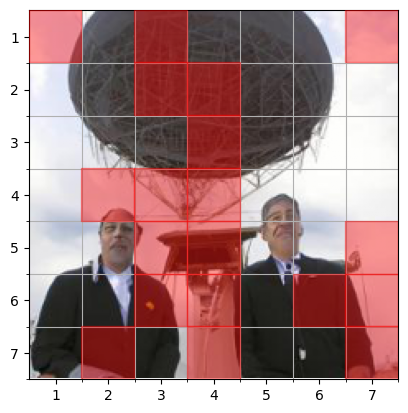

In [35]:
fig, ax = plt.subplots()

for iss,se in enumerate([94]):

    img_t = load_image(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/"+img+f"_t{t*4:04d}.JPEG", crop=True)
    clip_t, _ = image_to_clip(f"/home/sclocchi/datasets_diffusion/selected_ILSVRC2012/diffused_ILSVRC2012_validation-seed_{se}/t_{t}_250_images/"+img+f"_t{t*4:04d}.JPEG")

    ax = represent_img_patches(img_t, clip_t, ax, fig)

fig.savefig(f"../../plots/clip_diffusion/{img}_t{t}_seed{se}.png", dpi=600, bbox_inches='tight')
    
plt.show()